# Import libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
import os

# Import raw data

In [2]:
#Defining function to check if directory exists, if not it generates it
def check_and_make_dir(dir):
    if not os.path.isdir(dir):os.mkdir(dir)
#Base directory 
base_dir = '/Users/samsonmercier/Desktop/Work/PhD/Research/Second_Generals/'
#File containing temperature values
raw_T_data = np.loadtxt(base_dir+'Data/bt-4500k/training_data_T.csv', delimiter=',')
#File containing pressure values
raw_P_data = np.loadtxt(base_dir+'Data/bt-4500k/training_data_P.csv', delimiter=',')
#Path to store model
model_save_path = base_dir+'Model_Storage/NN_likeLoss/'
check_and_make_dir(model_save_path)
#Path to store plots
plot_save_path = base_dir+'Plots/NN_likeLoss/'
check_and_make_dir(plot_save_path)

#Last 51 columns are the temperature/pressure values, 
#First 5 are the input values (H2 pressure in bar, CO2 pressure in bar, LoD in hours, Obliquity in deg, H2+Co2 pressure) but we remove the last one since it's not adding info.
raw_inputs = raw_T_data[:, :4]
raw_outputs_T = raw_T_data[:, 5:]
raw_outputs_P = raw_P_data[:, 5:]

#Storing useful quantitites
N = raw_inputs.shape[0] #Number of data points
D = raw_inputs.shape[1] #Number of features
O = 2*raw_outputs_T.shape[1] #Number of outputs

#Mode for optimization
run_mode = 'use'


# Defining hyper-parameters

In [3]:
#Defining partition of data used for 1. training 2. validation and 3. testing
data_partitions = [0.7, 0.1, 0.2]

#Defining the device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
num_threads = 6
torch.set_num_threads(num_threads)
print(f"Using {device} device with {num_threads} threads")
torch.set_default_device(device)

#Defining the noise seed
partition_seed = 4
rng = torch.Generator(device=device)
rng.manual_seed(partition_seed)

#Neural network width and depth
nn_width = 300
nn_depth = 5

#Optimizer learning rate
learning_rate = 1e-7

#Batch size 
batch_size = 64

#Number of epochs 
n_epochs = 3000

#Define storage for losses
train_losses = []
eval_losses = []

Using cpu device with 6 threads


# Fitting the training data with a basic deep neural network

## First step : Define a training, validation, and testing set

In [4]:
#Splitting the data 

## Retrieving indices of data partitions
train_idx, valid_idx, test_idx = torch.utils.data.random_split(range(N), data_partitions, generator=rng)

## Generate the data partitions
### Training
train_inputs = torch.tensor(raw_inputs[train_idx], dtype=torch.float32)
train_outputs_T = torch.tensor(raw_outputs_T[train_idx], dtype=torch.float32)
train_outputs_P = torch.tensor(raw_outputs_P[train_idx], dtype=torch.float32)
### Validation
valid_inputs = torch.tensor(raw_inputs[valid_idx], dtype=torch.float32)
valid_outputs_T = torch.tensor(raw_outputs_T[valid_idx], dtype=torch.float32)
valid_outputs_P = torch.tensor(raw_outputs_P[valid_idx], dtype=torch.float32)
### Testing
test_inputs = torch.tensor(raw_inputs[test_idx], dtype=torch.float32)
test_outputs_T = torch.tensor(raw_outputs_T[test_idx], dtype=torch.float32)
test_outputs_P = torch.tensor(raw_outputs_P[test_idx], dtype=torch.float32)

## Concatenating outputs
train_outputs = torch.cat([
    train_outputs_T,
    np.log10(train_outputs_P/1000)
], dim=1)

valid_outputs = torch.cat([
    valid_outputs_T,
    np.log10(valid_outputs_P/1000)
], dim=1)

##Generating data loaders
train_dataloader = DataLoader(TensorDataset(train_inputs,train_outputs), batch_size=64, generator=rng, shuffle=True)
eval_dataloader = DataLoader(TensorDataset(valid_inputs,valid_outputs), batch_size=64, generator=rng)

/var/folders/zb/dzv8y8kn1dl5qhcybvz_4nv00000gn/T/ipykernel_33340/3152891471.py:23: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.log10(train_outputs_P/1000)
/var/folders/zb/dzv8y8kn1dl5qhcybvz_4nv00000gn/T/ipykernel_33340/3152891471.py:28: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.log10(valid_outputs_P/1000)


## Second step : Define the neural network

In [5]:
class NeuralNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, depth):
        super().__init__()
        
        layers = []
        self.output_dim = output_dim

        # Input layer
        layers.append(nn.Linear(input_dim, hidden_dim))
        layers.append(nn.ReLU())
        
        # Hidden layers
        for _ in range(depth):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.ReLU())
        
        # Output layer
        layers.append(nn.Linear(hidden_dim, 2 * output_dim))
        
        # Pack all layers into a Sequential container
        self.linear_relu_stack = nn.Sequential(*layers)
        
    def forward(self, x):
        out = self.linear_relu_stack(x)
        mu = out[..., :self.output_dim]            # first half: mean
        log_sigma = out[..., self.output_dim:]     # second half: log σ
        sigma = torch.exp(torch.clamp(log_sigma, min=-4, max=4))  # ensure positivity
        return mu, sigma

In [6]:
model = NeuralNetwork(D, nn_width, O, nn_depth).to(device)
print(model)

NeuralNetwork(
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=4, out_features=300, bias=True)
    (1): ReLU()
    (2): Linear(in_features=300, out_features=300, bias=True)
    (3): ReLU()
    (4): Linear(in_features=300, out_features=300, bias=True)
    (5): ReLU()
    (6): Linear(in_features=300, out_features=300, bias=True)
    (7): ReLU()
    (8): Linear(in_features=300, out_features=300, bias=True)
    (9): ReLU()
    (10): Linear(in_features=300, out_features=300, bias=True)
    (11): ReLU()
    (12): Linear(in_features=300, out_features=204, bias=True)
  )
)


## Fourth step : Define optimization functions

In [7]:
# --- Training loop ---
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()
    total_loss=0
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction and loss
        mu, sigma = model(X)
        loss = loss_fn(mu, sigma, y)

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total_loss+=loss.item()
        print(f"Train loss: {loss.item():>7f}  [{batch * batch_size + len(X):>5d}/{size:>5d}]")

    #Store loss
    train_losses.append(total_loss/len(dataloader))




# --- Evaluation loop ---
def eval_loop(dataloader, model, loss_fn):
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    num_batches = len(dataloader)
    eval_loss = 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y in dataloader:
            mu, sigma = model(X)
            eval_loss += loss_fn(mu, sigma, y).item()

    #Store loss
    eval_loss /= num_batches
    eval_losses.append(eval_loss)
    print(f"Eval loss={eval_loss:.5f}")


# --- PyTorch-native Gaussian NLL loss ---
def gaussian_nll_loss(mu, sigma, y):
    dist = torch.distributions.Normal(mu, sigma)
    # Return mean negative log likelihood
    return -dist.log_prob(y).mean()


## Fifth step : Run optimization

In [8]:
# --- Loss and optimizer ---
loss_fn = gaussian_nll_loss
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

if run_mode == 'use':
    # --- Optimization ---
    for t in range(n_epochs):
        print(f"Epoch {t+1}\n-------------------------------")
        train_loop(train_dataloader, model, loss_fn, optimizer)
        eval_loop(eval_dataloader, model, loss_fn)
    print("Done!")

    #Save everything 
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'eval_losses': eval_losses
    }, 
    model_save_path + f'{n_epochs}epochs_{learning_rate}LR_{batch_size}BS.pth')
    

else:
    #Load model
    dataload = torch.load(model_save_path + f'{n_epochs}epochs_{learning_rate}LR_{batch_size}BS.pth')

    model.load_state_dict(dataload['model_state_dict'])
    optimizer.load_state_dict(dataload['optimizer_state_dict'])
    train_losses = dataload['train_losses']
    eval_losses = dataload['eval_losses']

Epoch 1
-------------------------------
Train loss: 13491.205078  [   64/ 7000]
Train loss: 12710.268555  [  128/ 7000]
Train loss: 13017.475586  [  192/ 7000]
Train loss: 13593.345703  [  256/ 7000]
Train loss: 12726.372070  [  320/ 7000]
Train loss: 12267.306641  [  384/ 7000]
Train loss: 12124.600586  [  448/ 7000]
Train loss: 12004.558594  [  512/ 7000]
Train loss: 12014.607422  [  576/ 7000]
Train loss: 11583.436523  [  640/ 7000]
Train loss: 11882.004883  [  704/ 7000]
Train loss: 11814.845703  [  768/ 7000]
Train loss: 11944.522461  [  832/ 7000]
Train loss: 11759.412109  [  896/ 7000]
Train loss: 12034.617188  [  960/ 7000]
Train loss: 12111.517578  [ 1024/ 7000]
Train loss: 11485.929688  [ 1088/ 7000]
Train loss: 11517.474609  [ 1152/ 7000]
Train loss: 11365.377930  [ 1216/ 7000]
Train loss: 11480.375000  [ 1280/ 7000]
Train loss: 11095.209961  [ 1344/ 7000]
Train loss: 11081.354492  [ 1408/ 7000]
Train loss: 10874.073242  [ 1472/ 7000]
Train loss: 10475.659180  [ 1536/ 7000]


## Sixth step : Diagnostic plots

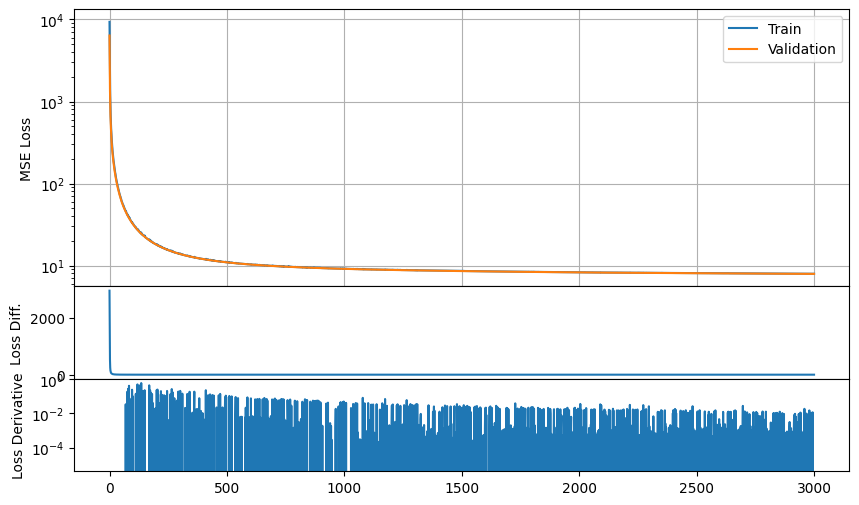

In [12]:
# Loss curves
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, gridspec_kw={'height_ratios':[3, 1, 1]}, figsize=(10, 6))
ax1.plot(np.arange(n_epochs), train_losses, label="Train")
ax1.plot(np.arange(n_epochs), eval_losses, label="Validation")
ax2.plot(np.arange(n_epochs), np.array(train_losses) - np.array(eval_losses))
ax3.plot(np.arange(n_epochs-1), np.diff(train_losses))
ax1.set_yscale('log')
ax3.set_yscale('log')
ax2.set_xlabel("Epoch")
ax1.set_ylabel("MSE Loss")
ax2.set_ylabel("Loss Diff.")
ax3.set_ylabel("Loss Derivative")
ax1.legend()
ax1.grid()
plt.subplots_adjust(hspace=0)
plt.savefig(plot_save_path+'/loss.pdf')

/var/folders/zb/dzv8y8kn1dl5qhcybvz_4nv00000gn/T/ipykernel_33340/2231868548.py:36: RuntimeWarning: invalid value encountered in log10
  axs['results'].errorbar(pred_output_T, np.log10(pred_output_P/1000), xerr=pred_output_Terr, yerr=pred_output_Perr, fmt='.', color='green', linewidth=2)
/var/folders/zb/dzv8y8kn1dl5qhcybvz_4nv00000gn/T/ipykernel_33340/2231868548.py:36: RuntimeWarning: invalid value encountered in log10
  axs['results'].errorbar(pred_output_T, np.log10(pred_output_P/1000), xerr=pred_output_Terr, yerr=pred_output_Perr, fmt='.', color='green', linewidth=2)


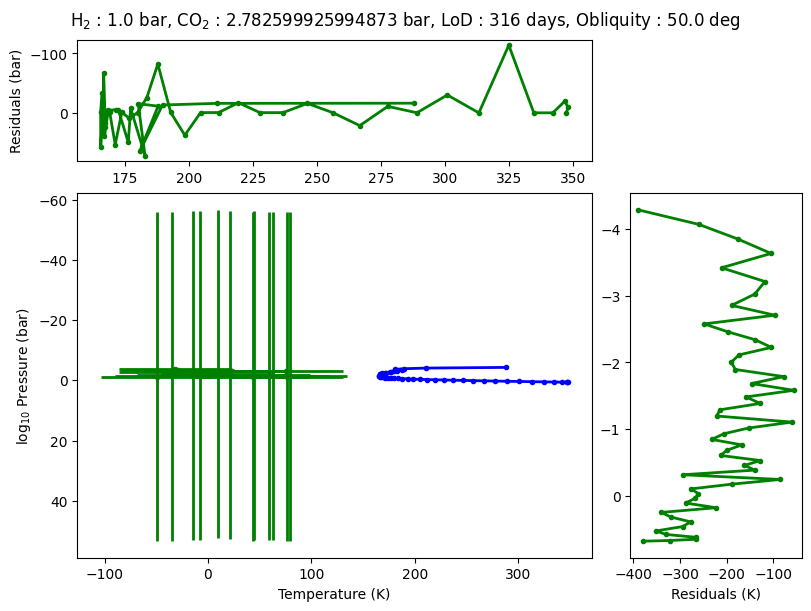

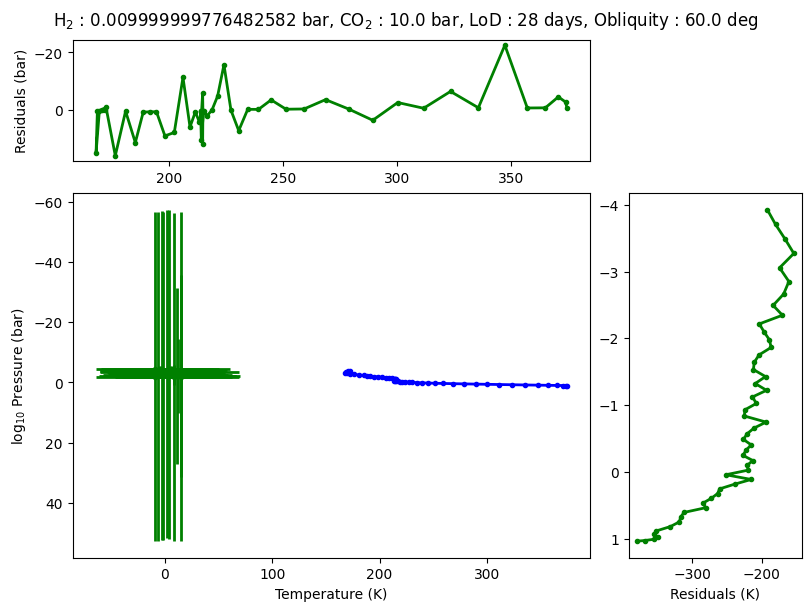

In [13]:
#Comparing predicted T-P profiles vs true T-P profiles with residuals
substep = 1000

#Converting tensors to numpy arrays if this isn't already done
if (type(test_outputs_T) != np.ndarray):
    test_outputs_T = test_outputs_T.numpy()
    test_outputs_P = test_outputs_P.numpy()

res_T = np.zeros(test_outputs_P.shape, dtype=float)
res_P = np.zeros(test_outputs_P.shape, dtype=float)
for test_idx, (test_input, test_output_T, test_output_P) in enumerate(zip(test_inputs, test_outputs_T, test_outputs_P)):

    #Retrieve prediction
    pred_output_mu, pred_output_sigma = model(test_input)
    pred_output_mu = pred_output_mu.detach().numpy()
    pred_output_sigma = pred_output_sigma.detach().numpy()    
    pred_output_T = pred_output_mu[:51]
    pred_output_P = pred_output_mu[51:]
    pred_output_Terr = pred_output_sigma[:51]
    pred_output_Perr = pred_output_sigma[51:]

    #Convert to numpy
    test_input = test_input.numpy()

    #Storing residuals 
    res_T[test_idx, :] = pred_output_T - test_output_T
    res_P[test_idx, :] = pred_output_P - np.log10(test_output_P/1000)
    #Plotting
    if (test_idx % substep == 0):
        fig, axs = plt.subplot_mosaic([['res_pressure', '.'],
                                       ['results', 'res_temperature']],
                              figsize=(8, 6),
                              width_ratios=(3, 1), height_ratios=(1, 3),
                              layout='constrained')        
        axs['results'].plot(test_output_T, np.log10(test_output_P/1000), '.', linestyle='-', color='blue', linewidth=2)
        axs['results'].errorbar(pred_output_T, np.log10(pred_output_P/1000), xerr=pred_output_Terr, yerr=pred_output_Perr, fmt='.', color='green', linewidth=2)
        axs['results'].invert_yaxis()
        axs['results'].set_ylabel(r'log$_{10}$ Pressure (bar)')
        axs['results'].set_xlabel('Temperature (K)')
        axs['res_temperature'].plot(pred_output_T - test_output_T, np.log10(test_output_P/1000), '.', linestyle='-', color='green', linewidth=2)
        axs['res_temperature'].set_xlabel('Residuals (K)')
        axs['res_temperature'].invert_yaxis()
        axs['res_pressure'].plot(test_output_T, pred_output_P - np.log10(test_output_P/1000), '.', linestyle='-', color='green', linewidth=2)
        axs['res_pressure'].set_ylabel('Residuals (bar)')
        axs['res_pressure'].invert_yaxis()
        plt.suptitle(rf'H$_2$ : {test_input[0]} bar, CO$_2$ : {test_input[1]} bar, LoD : {test_input[2]:.0f} days, Obliquity : {test_input[3]} deg')
        plt.savefig(plot_save_path+f'/pred_vs_actual_n.{test_idx}.pdf')
    

Temperature Residuals : Median = -191.27 K, Std = 60.80 K
Pressure Residuals : Median = 0.308792666 $log_10$ bar, Std = 13.885178 $log_10$ bar


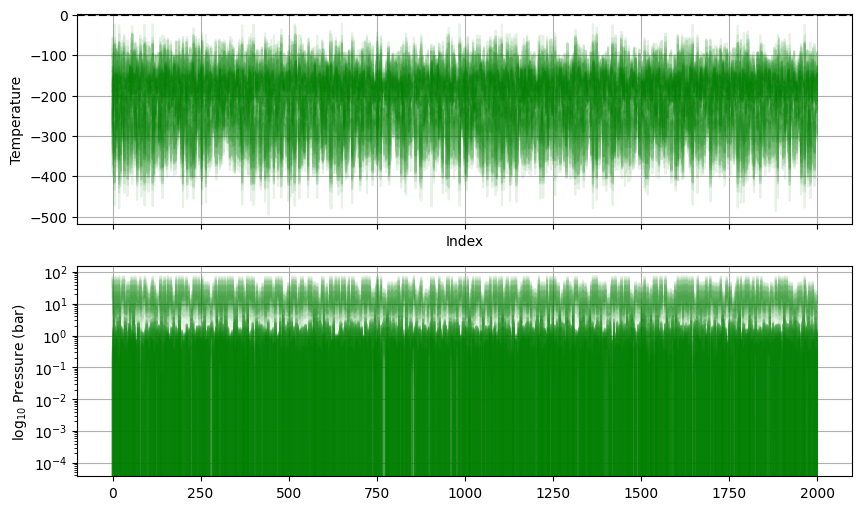

In [11]:
print(f'Temperature Residuals : Median = {np.median(res_T):.2f} K, Std = {np.std(res_T):.2f} K')
print(rf'Pressure Residuals : Median = {np.median(res_P):.9} $log_{10}$ bar, Std = {np.std(res_P):.9} $log_{10}$ bar')

#Plot residuals
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=[10, 6])
ax1.plot(res_T, alpha=0.1, color='green')
ax2.plot(res_P, alpha=0.1, color='green')
for ax in [ax1, ax2]:ax.axhline(0, color='black', linestyle='dashed')
ax1.set_xlabel('Index')
ax1.set_ylabel('Temperature')
ax2.set_ylabel('log$_{10}$ Pressure (bar)')
ax2.set_yscale('log')
for ax in [ax1, ax2]:ax.grid()
plt.show()